#Step1 : Data Preparation

In [ ]:
import os
import urllib.request #loading data from a URL
import tarfile

url = "http://data.vision.ee.ethz.ch/cvl/food-101.tar.gz"
filename = "food-101.tar.gz"

if not os.path.exists("food-101"):
    print("📦 Downloading Food-101 dataset... (this may take a while)")
    urllib.request.urlretrieve(url, filename)

    print("📂 Extracting files...")
    with tarfile.open(filename, "r:gz") as tar:
        tar.extractall()
    print("✅ Extraction done!")
else:
    print("✅ Dataset already exists.")

✅ Dataset already exists.


In [4]:
import os
import shutil #command to copy files

# Base directory of the dataset
ROOT = r"C:\Users\jainka\OneDrive - Hewlett Packard Enterprise\DS-C-WE-E-B57\Food Image Classification\food-101"
IMAGES_DIR = os.path.join(ROOT, "images")
META_DIR = os.path.join(ROOT, "meta")

# Train/test text files
TRAIN_FILE = os.path.join(META_DIR, "train.txt")
TEST_FILE = os.path.join(META_DIR, "test.txt")

# Output directories
TRAIN_OUT = os.path.join(ROOT, "train")
TEST_OUT = os.path.join(ROOT, "test")

os.makedirs(TRAIN_OUT, exist_ok=True)
os.makedirs(TEST_OUT, exist_ok=True)

def copy_split(txt_file, out_dir):
    """Copy images listed in txt_file into ImageFolder structure."""
    with open(txt_file, "r") as f:
        lines = f.read().splitlines()

    for line in lines:
        class_name, image_name = line.split("/")

        src = os.path.join(IMAGES_DIR, class_name, f"{image_name}.jpg")

        class_folder = os.path.join(out_dir, class_name)
        os.makedirs(class_folder, exist_ok=True)

        dst = os.path.join(class_folder, f"{image_name}.jpg")

        shutil.copy(src, dst)
        print("Copied:", dst)


print("📌 Organizing TRAIN split...")
copy_split(TRAIN_FILE, TRAIN_OUT)

print("📌 Organizing TEST split...")
copy_split(TEST_FILE, TEST_OUT)

print("🎉 Done! Dataset is now ready for PyTorch ImageFolder.")


📌 Organizing TRAIN split...
Copied: C:\Users\jainka\OneDrive - Hewlett Packard Enterprise\DS-C-WE-E-B57\Food Image Classification\food-101\train\apple_pie\1005649.jpg
Copied: C:\Users\jainka\OneDrive - Hewlett Packard Enterprise\DS-C-WE-E-B57\Food Image Classification\food-101\train\apple_pie\1014775.jpg
Copied: C:\Users\jainka\OneDrive - Hewlett Packard Enterprise\DS-C-WE-E-B57\Food Image Classification\food-101\train\apple_pie\1026328.jpg
Copied: C:\Users\jainka\OneDrive - Hewlett Packard Enterprise\DS-C-WE-E-B57\Food Image Classification\food-101\train\apple_pie\1028787.jpg
Copied: C:\Users\jainka\OneDrive - Hewlett Packard Enterprise\DS-C-WE-E-B57\Food Image Classification\food-101\train\apple_pie\1043283.jpg
Copied: C:\Users\jainka\OneDrive - Hewlett Packard Enterprise\DS-C-WE-E-B57\Food Image Classification\food-101\train\apple_pie\1050519.jpg
Copied: C:\Users\jainka\OneDrive - Hewlett Packard Enterprise\DS-C-WE-E-B57\Food Image Classification\food-101\train\apple_pie\1057749.jpg

#Step2 : EDA

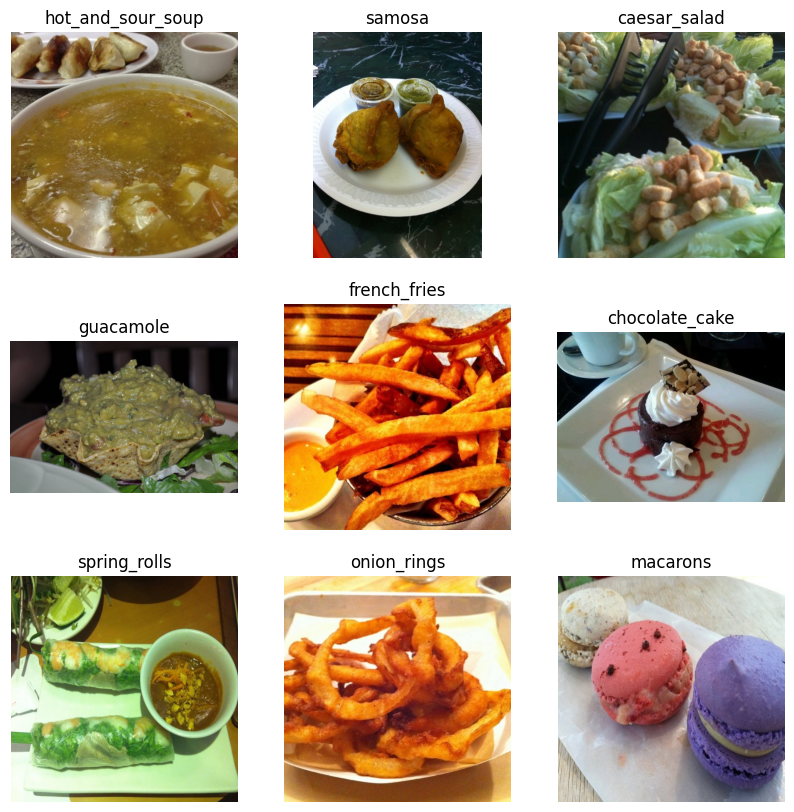

In [3]:
#Displaying sample images from the training set
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

DATA_DIR = "food-101/train"

# Pick 9 random images
all_classes = os.listdir(DATA_DIR)
sample_images = []

for _ in range(9):
    cls = random.choice(all_classes)
    img_name = random.choice(os.listdir(os.path.join(DATA_DIR, cls)))
    img_path = os.path.join(DATA_DIR, cls, img_name)
    sample_images.append((cls, img_path))

# Plot 3×3 grid
plt.figure(figsize=(10, 10))
for i, (cls, img_path) in enumerate(sample_images):
    img = Image.open(img_path)
    plt.subplot(3, 3, i+1)
    plt.imshow(img)
    plt.title(cls)
    plt.axis("off")

plt.show()



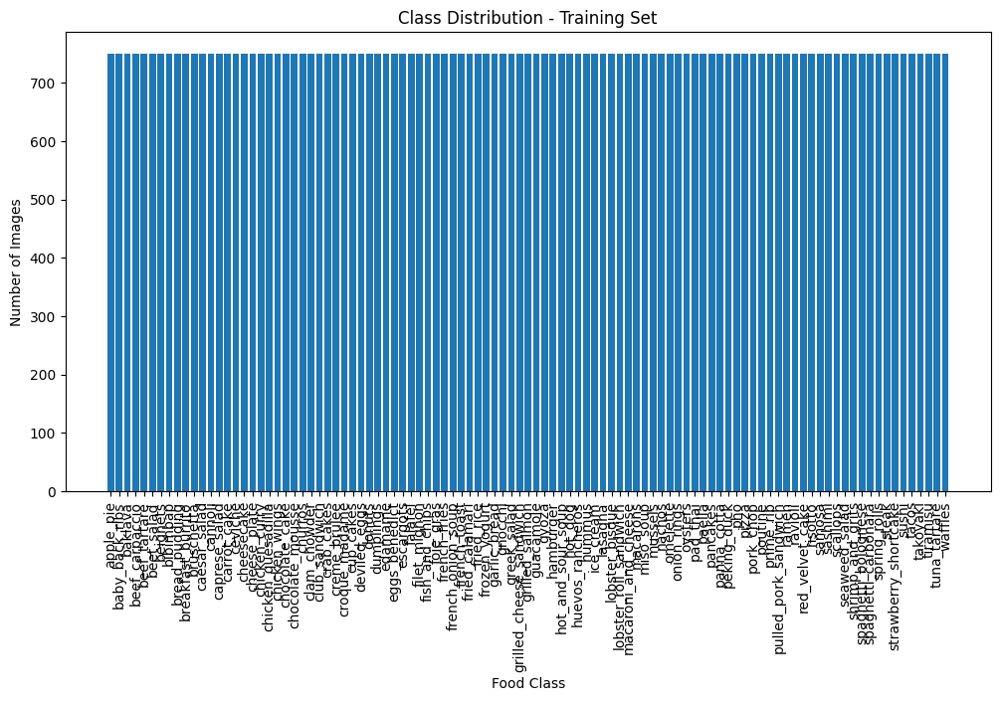

In [ ]:
#Class distribution visualization
import os
import pandas as pd
import matplotlib.pyplot as plt

DATA_DIR = "food-101/train"

class_counts = {}

for cls in os.listdir(DATA_DIR):
    count = len(os.listdir(os.path.join(DATA_DIR, cls)))
    class_counts[cls] = count

df = pd.DataFrame(list(class_counts.items()), columns=['Class', 'Count'])
df = df.sort_values("Count", ascending=False)

# Plot
plt.figure(figsize=(12, 6))
plt.bar(df['Class'], df['Count'])
plt.xticks(rotation=90)
plt.title("Class Distribution - Training Set")
plt.xlabel("Food Class")
plt.ylabel("Number of Images")
plt.show()


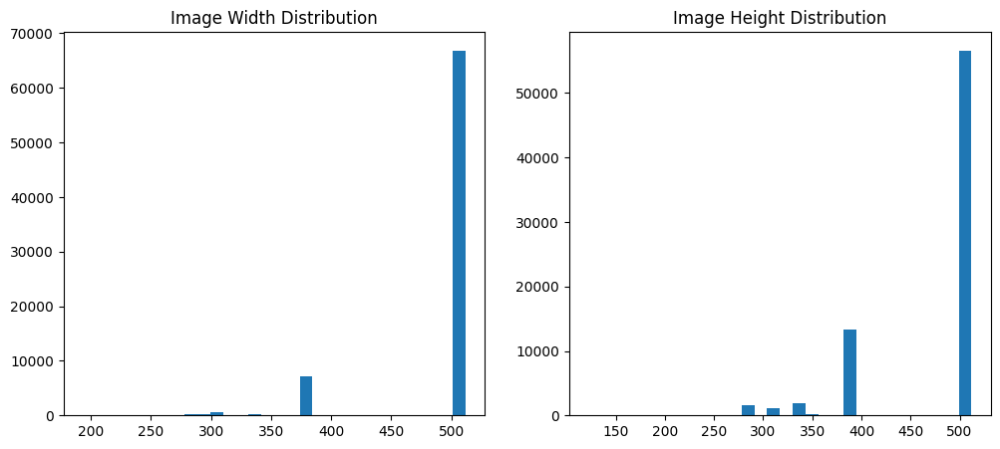

In [ ]:
#inspecting image resolutions
#for every image in the training set, we will record its width and height and then plot the distributions of these dimensions.
from PIL import Image
import numpy as np

DATA_DIR = "food-101/train"

widths = []
heights = []

for cls in os.listdir(DATA_DIR):
    cls_path = os.path.join(DATA_DIR, cls)
    for img_name in os.listdir(cls_path):
        img_path = os.path.join(cls_path, img_name)
        img = Image.open(img_path)
        w, h = img.size
        widths.append(w)
        heights.append(h)

# Plot width & height distributions
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.hist(widths, bins=30)
plt.title("Image Width Distribution")

plt.subplot(1, 2, 2)
plt.hist(heights, bins=30)
plt.title("Image Height Distribution")

plt.show()


#Step3 : Data Augmentation

In [8]:
from torchvision import transforms

# ImageNet mean and std (required for pretrained CNNs)
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

# Training transformations
train_transforms = transforms.Compose([
    transforms.RandomResizedCrop(160),        # Random crop + resize
    transforms.RandomHorizontalFlip(p=0.5),   # Flip left-right
    transforms.RandomRotation(20),            # +/- 20 degrees rotation
    transforms.ColorJitter(0.2, 0.2, 0.2, 0.1), # Brightness, contrast, saturation
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)
])

# Validation/Test transformations (NO augmentation)
test_transforms = transforms.Compose([
    transforms.Resize((224, 224)),           # Just resize
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)
])


In [ ]:
#splitting dataset and creating data loaders
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, random_split

train_dataset = ImageFolder("food-101/train", transform=train_transforms)
test_dataset  = ImageFolder("food-101/test", transform=test_transforms)

# -----------------------------
# Create Train/Validation Split
# -----------------------------
val_size = int(0.1 * len(train_dataset))   # 10% validation
train_size = len(train_dataset) - val_size

train_data, val_data = random_split(train_dataset, [train_size, val_size])

val_data.dataset.transform = test_transforms   # IMPORTANT: validation = test transforms only

# -----------------------------
# Data Loaders
# -----------------------------
train_loader = DataLoader(train_data, batch_size=32, shuffle=True, num_workers=4, pin_memory=False)
val_loader   = DataLoader(val_data, batch_size=32, shuffle=False, num_workers=4, pin_memory=False)
test_loader  = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=4, pin_memory=False)

#Step 4: Model Selection and Transfer Learning


🔵 Epoch 1/3
Train Loss: 3.2717 | Train F1: 0.3397
Val Loss:   2.1715 | Val F1:   0.5024
🔥 Saved New Best Model!

🔵 Epoch 2/3
Train Loss: 1.8938 | Train F1: 0.5446
Val Loss:   1.6591 | Val F1:   0.5882
🔥 Saved New Best Model!

🔵 Epoch 3/3
Train Loss: 1.5583 | Train F1: 0.6088
Val Loss:   1.4624 | Val F1:   0.6255
🔥 Saved New Best Model!

🔥 Final Test Macro F1 Score: 0.6832830809478804


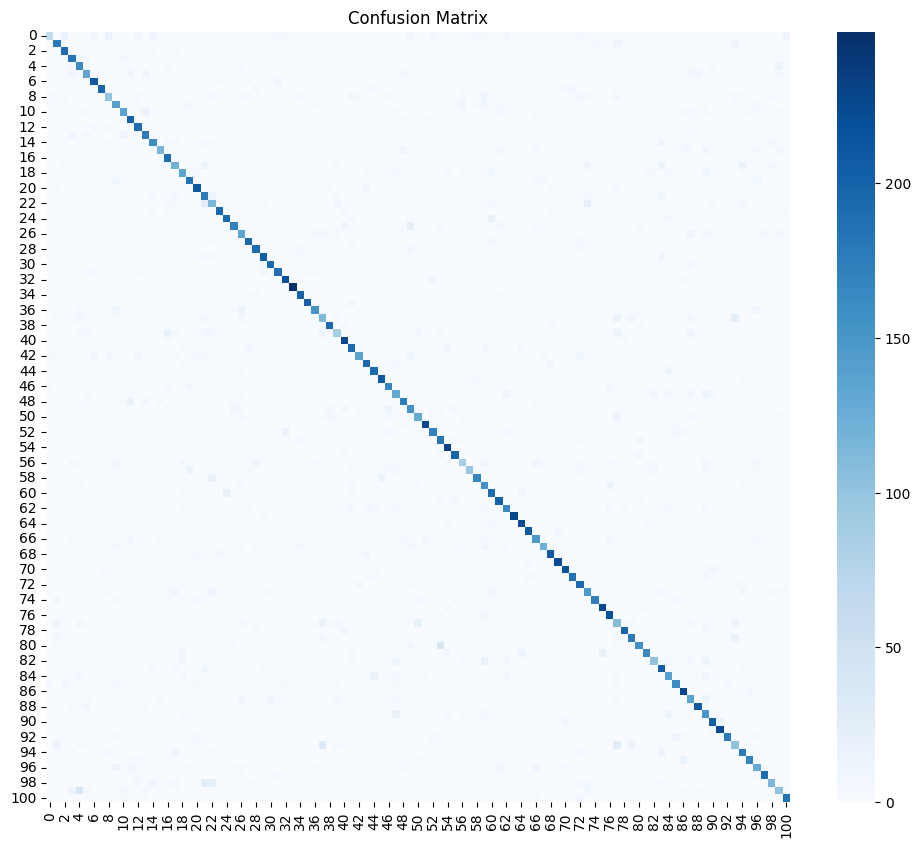


📌 Classification Report:
              precision    recall  f1-score   support

           0       0.54      0.26      0.35       250
           1       0.69      0.71      0.70       250
           2       0.69      0.76      0.72       250
           3       0.65      0.73      0.69       250
           4       0.54      0.64      0.59       250
           5       0.59      0.53      0.56       250
           6       0.81      0.84      0.82       250
           7       0.82      0.79      0.80       250
           8       0.51      0.40      0.45       250
           9       0.62      0.56      0.59       250
          10       0.60      0.54      0.57       250
          11       0.62      0.81      0.70       250
          12       0.68      0.76      0.72       250
          13       0.64      0.70      0.67       250
          14       0.70      0.64      0.67       250
          15       0.62      0.46      0.53       250
          16       0.60      0.76      0.67       250
 

In [ ]:
# Evaluating performance using Resnet50
import torch
import torch.nn as nn
from torchvision import models
from sklearn.metrics import f1_score, confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# -----------------------------------------------------
# 1. MODEL SELECTION (TRANSFER LEARNING)
# -----------------------------------------------------

def get_resnet50_model(num_classes=101):
    model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)

    # Freeze ONLY convolution layers, NOT BatchNorm
    for name, param in model.named_parameters():
        if "bn" not in name.lower():
            param.requires_grad = False

    # Replace final layer
    in_features = model.fc.in_features
    model.fc = nn.Linear(in_features, num_classes)

    return model


def get_efficientnet_b0(num_classes=101):
    model = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.IMAGENET1K_V1)

    # Freeze ONLY conv layers, not BatchNorm
    for name, param in model.named_parameters():
        if "bn" not in name.lower():
            param.requires_grad = False

    # Replace classifier
    in_features = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(in_features, num_classes)

    return model


# -----------------------------------------------------
# 2. DEVICE SETUP & MODEL INIT
# -----------------------------------------------------

num_classes = 101
model_choice = "resnet50"  

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = get_resnet50_model(num_classes) if model_choice == "resnet50" else get_efficientnet_b0(num_classes)
model = model.to(device)


# -----------------------------------------------------
# 3. TRAINING COMPONENTS
# -----------------------------------------------------

criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=1e-4,
    weight_decay=1e-4
)

#Learning Rate Scheduler
#This automatically reduces the learning rate when progress slows.
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='max', #If you used mode='max' , You'd be telling the scheduler:"Larger value means better results"
    factor=0.5,
    patience=2
)


# -----------------------------------------------------
# 4. TRAINING & VALIDATION
# -----------------------------------------------------

def train_one_epoch(model, dataloader, criterion, optimizer, device):
    model.train()
    total_loss = 0
    preds, targets = [], []

    for images, labels in dataloader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        total_loss += loss.item()

        preds.extend(outputs.argmax(1).cpu().tolist())
        targets.extend(labels.cpu().tolist())

    return total_loss / len(dataloader), f1_score(targets, preds, average='macro')


def validate(model, dataloader, criterion, device):
    model.eval()
    total_loss = 0
    preds, targets = [], []

    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            total_loss += loss.item()

            preds.extend(outputs.argmax(1).cpu().tolist())
            targets.extend(labels.cpu().tolist())

    return total_loss / len(dataloader), f1_score(targets, preds, average='macro')


# -----------------------------------------------------
# 5. FULL TRAINING LOOP
# -----------------------------------------------------

epochs = 3
best_f1 = 0

for epoch in range(1, epochs + 1):
    print(f"\n🔵 Epoch {epoch}/{epochs}")

    train_loss, train_f1 = train_one_epoch(model, train_loader, criterion, optimizer, device)
    val_loss, val_f1     = validate(model, val_loader, criterion, device)

    scheduler.step(val_f1)

    print(f"Train Loss: {train_loss:.4f} | Train F1: {train_f1:.4f}")
    print(f"Val Loss:   {val_loss:.4f} | Val F1:   {val_f1:.4f}")

    if val_f1 > best_f1:
        best_f1 = val_f1
        torch.save(model.state_dict(), "best_model1.pth")
        print("🔥 Saved New Best Model!")


# -----------------------------------------------------
# 6. TEST SET EVALUATION
# -----------------------------------------------------

all_preds, all_targets = [], []

model.eval()
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        outputs = model(images)
        preds = outputs.argmax(1).cpu().tolist()

        all_preds.extend(preds)
        all_targets.extend(labels.tolist())

# MACRO F1
macro_f1 = f1_score(all_targets, all_preds, average='macro')
print("\n🔥 Final Test Macro F1 Score:", macro_f1)

# CONFUSION MATRIX
cm = confusion_matrix(all_targets, all_preds)
plt.figure(figsize=(12, 10))
sns.heatmap(cm, cmap="Blues")
plt.title("Confusion Matrix")
plt.show()

# CLASSIFICATION REPORT
print("\n📌 Classification Report:")
print(classification_report(all_targets, all_preds))


#Step 5: Resnet Model Interpretation using Grad-CAM


Model Loaded: ResNet

Predicted Label: pizza
Actual Label:     pizza

🎉 CORRECT PREDICTION!


c:\Users\jainka\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\nn\modules\module.py:1864: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


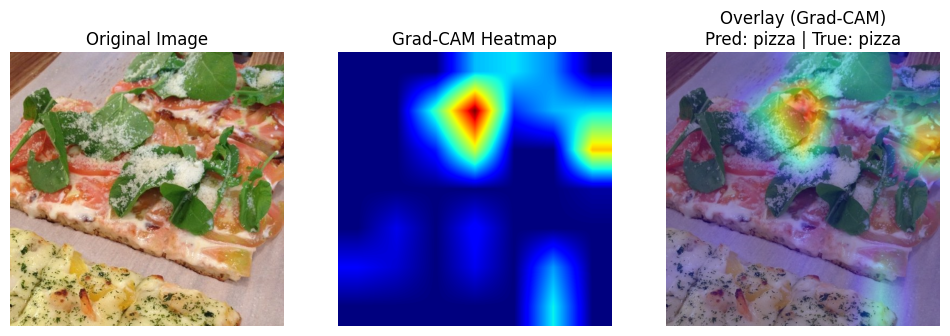

In [ ]:
#Grad-CAM helps you see what part of an image the model looked at when making a prediction.
#🔴 Red / Yellow Areas → High focus-These are the regions the model thinks are most important for the prediction.
 #The model assigns highest gradient weight here.
#🟡 Orange Areas → Medium focus-Some influence, but not major.
#🔵 / Transparent Areas → Low or No influence-These parts were ignored by the network.


import torch
import torch.nn.functional as F
from torchvision import models, transforms
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# 1️⃣ LOAD MODEL (ResNet50 - ImageNet Trained)
# ---------------------------------------------------------
weights = models.ResNet50_Weights.IMAGENET1K_V2
model = models.resnet50(weights=weights)
model.eval()

print("\nModel Loaded:", model.__class__.__name__)

# Get class labels
class_names = weights.meta["categories"]

# ---------------------------------------------------------
# 2️⃣ SELECT TARGET LAYER (Last Conv Layer of ResNet)
# ---------------------------------------------------------
target_layer = model.layer4[-1].conv3

activations = None
gradients = None

#to capture feature maps and gradients
def forward_hook(module, input, output):
    global activations
    activations = output

def backward_hook(module, grad_in, grad_out):
    global gradients
    gradients = grad_out[0]

# Register hooks
target_layer.register_forward_hook(forward_hook)
target_layer.register_backward_hook(backward_hook)

# ---------------------------------------------------------
# 3️⃣ LOAD & PREPROCESS IMAGE
# ---------------------------------------------------------
image_path = r"C:\Users\jainka\OneDrive - Hewlett Packard Enterprise\DS-C-WE-E-B57\Food Image Classification\food-101\test\pizza\2265512.jpg"

img = Image.open(image_path).convert("RGB")

preprocess = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

input_tensor = preprocess(img).unsqueeze(0)  # Shape must be [1,3,224,224]

# ---------------------------------------------------------
# 4️⃣ FORWARD + BACKWARD PASS
# ---------------------------------------------------------
output = model(input_tensor)
pred_class = output.argmax().item()
pred_label = class_names[pred_class]

# Extract true label from folder name in path
true_label = image_path.split("\\")[-2]

print("\nPredicted Label:", pred_label)
print("Actual Label:    ", true_label)

if pred_label.lower() == true_label.lower():
    print("\n🎉 CORRECT PREDICTION!")
else:
    print("\n❌ WRONG PREDICTION.")

model.zero_grad()
output[0, pred_class].backward()

# ---------------------------------------------------------
# 5️⃣ GRAD-CAM HEATMAP
# ---------------------------------------------------------
gradients_mean = gradients.mean(dim=[2, 3], keepdim=True)
cam = (gradients_mean * activations).sum(dim=1).squeeze()
cam = np.maximum(cam.detach().cpu().numpy(), 0)
cam /= cam.max()

# Resize CAM to input image size
cam = cv2.resize(cam, (img.size[0], img.size[1]))

# Apply heatmap
heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)

superimposed = np.uint8(heatmap * 0.4 + np.array(img) * 0.6)

# ---------------------------------------------------------
# 6️⃣ DISPLAY RESULTS
# ---------------------------------------------------------
plt.figure(figsize=(12,5))

plt.subplot(1,3,1)
plt.title("Original Image")
plt.imshow(img)
plt.axis("off")

plt.subplot(1,3,2)
plt.title("Grad-CAM Heatmap")
plt.imshow(cam, cmap="jet")
plt.axis("off")

plt.subplot(1,3,3)
plt.title(f"Overlay (Grad-CAM)\nPred: {pred_label} | True: {true_label}")
plt.imshow(superimposed)
plt.axis("off")

plt.show()


#Step 6: Transfer Learning using EffiecientNet-B0


========== Epoch 1/10 ==========


C:\Users\jainka\AppData\Local\Temp\ipykernel_20400\3190867940.py:83: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=scaler is not None):


Train  | Loss: 3.8633 | F1: 0.2462
Val    | Loss: 3.2329 | F1: 0.3715
🔥 New Best Model Saved!

========== Epoch 2/10 ==========


C:\Users\jainka\AppData\Local\Temp\ipykernel_20400\3190867940.py:83: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=scaler is not None):


Train  | Loss: 2.9867 | F1: 0.3784
Val    | Loss: 2.7230 | F1: 0.4118
🔥 New Best Model Saved!

========== Epoch 3/10 ==========


C:\Users\jainka\AppData\Local\Temp\ipykernel_20400\3190867940.py:83: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=scaler is not None):


Train  | Loss: 2.6167 | F1: 0.4168
Val    | Loss: 2.4443 | F1: 0.4422
🔥 New Best Model Saved!

========== Epoch 4/10 ==========


C:\Users\jainka\AppData\Local\Temp\ipykernel_20400\3190867940.py:83: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=scaler is not None):


Train  | Loss: 2.4186 | F1: 0.4431
Val    | Loss: 2.3186 | F1: 0.4605
🔥 New Best Model Saved!

========== Epoch 5/10 ==========


C:\Users\jainka\AppData\Local\Temp\ipykernel_20400\3190867940.py:83: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=scaler is not None):


Train  | Loss: 2.2947 | F1: 0.4613
Val    | Loss: 2.2206 | F1: 0.4690
🔥 New Best Model Saved!

========== Epoch 6/10 ==========


C:\Users\jainka\AppData\Local\Temp\ipykernel_20400\3190867940.py:83: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=scaler is not None):


Train  | Loss: 2.2179 | F1: 0.4728
Val    | Loss: 2.1798 | F1: 0.4741
🔥 New Best Model Saved!

========== Epoch 7/10 ==========


C:\Users\jainka\AppData\Local\Temp\ipykernel_20400\3190867940.py:83: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=scaler is not None):


Train  | Loss: 2.1566 | F1: 0.4816
Val    | Loss: 2.1189 | F1: 0.4855
🔥 New Best Model Saved!

========== Epoch 8/10 ==========


C:\Users\jainka\AppData\Local\Temp\ipykernel_20400\3190867940.py:83: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=scaler is not None):


Train  | Loss: 2.1076 | F1: 0.4895
Val    | Loss: 2.0771 | F1: 0.4903
🔥 New Best Model Saved!

========== Epoch 9/10 ==========


C:\Users\jainka\AppData\Local\Temp\ipykernel_20400\3190867940.py:83: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=scaler is not None):


Train  | Loss: 2.0678 | F1: 0.4956
Val    | Loss: 2.0415 | F1: 0.4970
🔥 New Best Model Saved!

========== Epoch 10/10 ==========


C:\Users\jainka\AppData\Local\Temp\ipykernel_20400\3190867940.py:83: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=scaler is not None):


Train  | Loss: 2.0304 | F1: 0.5041
Val    | Loss: 2.0129 | F1: 0.5026
🔥 New Best Model Saved!

Evaluating Best Model on Test Set...

🔥 Final Test Macro F1 Score: 0.5535


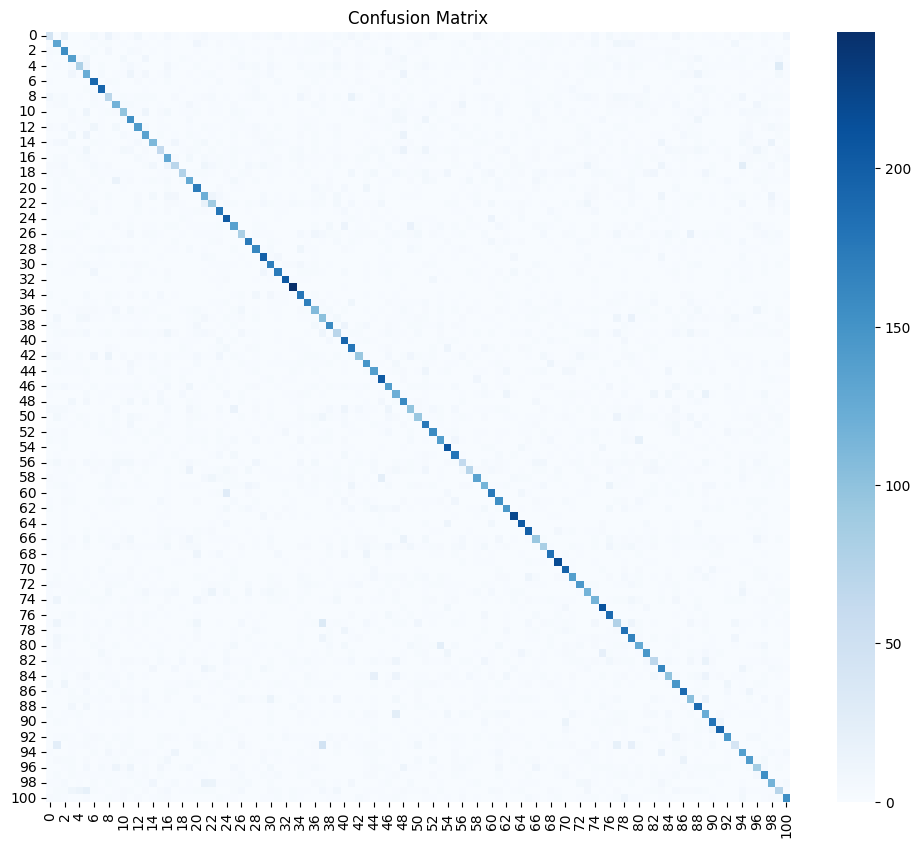


📌 Classification Report:
              precision    recall  f1-score   support

           0       0.35      0.18      0.23       250
           1       0.44      0.52      0.48       250
           2       0.52      0.62      0.57       250
           3       0.54      0.55      0.54       250
           4       0.51      0.32      0.39       250
           5       0.38      0.50      0.43       250
           6       0.66      0.76      0.71       250
           7       0.69      0.77      0.73       250
           8       0.34      0.28      0.30       250
           9       0.49      0.47      0.48       250
          10       0.51      0.39      0.44       250
          11       0.46      0.62      0.52       250
          12       0.61      0.57      0.59       250
          13       0.52      0.54      0.53       250
          14       0.61      0.44      0.52       250
          15       0.39      0.25      0.30       250
          16       0.44      0.51      0.47       250
 

In [11]:
import torch
import torch.nn as nn
from torchvision import models
from sklearn.metrics import f1_score, confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt


# -----------------------------------------------------
# 1. MODEL SELECTION (TRANSFER LEARNING)
# -----------------------------------------------------

def get_resnet50_model(num_classes=101):
    model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)

    # Freeze feature extractor (except BatchNorm)
    for name, param in model.named_parameters():
        if "bn" not in name.lower():
            param.requires_grad = False

    model.fc = nn.Linear(model.fc.in_features, num_classes)
    return model


def get_efficientnet_b0_model(num_classes=101):
    model = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.IMAGENET1K_V1)

    # Freeze feature layers
    for param in model.features.parameters():
        param.requires_grad = False

    in_features = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(in_features, num_classes)
    return model


# -----------------------------------------------------
# 2. DEVICE SETUP & MODEL INIT
# -----------------------------------------------------

num_classes = 101
model_choice = "efficientnet_b0"  # or "resnet50"

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

efficient_model = (
    get_resnet50_model(num_classes)
    if model_choice == "resnet50"
    else get_efficientnet_b0_model(num_classes)
)

efficient_model.to(device)


# -----------------------------------------------------
# 3. TRAINING COMPONENTS
# -----------------------------------------------------

criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.AdamW(efficient_model.parameters(), lr=1e-4, weight_decay=1e-4)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='max', factor=0.5, patience=2
)

scaler = torch.cuda.amp.GradScaler() if torch.cuda.is_available() else None


# -----------------------------------------------------
# 4. TRAINING & VALIDATION
# -----------------------------------------------------

def train_one_epoch(model, dataloader, criterion, optimizer, device):
    model.train()
    total_loss, preds, targets = 0, [], []

    for images, labels in dataloader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()

        with torch.cuda.amp.autocast(enabled=scaler is not None):
            outputs = model(images)
            loss = criterion(outputs, labels)

        if scaler:
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
        else:
            loss.backward()
            optimizer.step()

        total_loss += loss.item()
        preds.extend(outputs.argmax(1).cpu().tolist())
        targets.extend(labels.cpu().tolist())

    return total_loss / len(dataloader), f1_score(targets, preds, average='macro')


def validate(model, dataloader, criterion, device):
    model.eval()
    total_loss, preds, targets = 0, [], []

    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)
            total_loss += loss.item()

            preds.extend(outputs.argmax(1).cpu().tolist())
            targets.extend(labels.cpu().tolist())

    return total_loss / len(dataloader), f1_score(targets, preds, average='macro')


# -----------------------------------------------------
# 5. TRAINING LOOP WITH EARLY STOPPING
# -----------------------------------------------------

epochs = 10
best_f1 = 0
patience_limit = 4
patience_counter = 0

for epoch in range(1, epochs + 1):
    print(f"\n========== Epoch {epoch}/{epochs} ==========")

    train_loss, train_f1 = train_one_epoch(efficient_model, train_loader, criterion, optimizer, device)
    val_loss, val_f1 = validate(efficient_model, val_loader, criterion, device)

    scheduler.step(val_f1)

    print(f"Train  | Loss: {train_loss:.4f} | F1: {train_f1:.4f}")
    print(f"Val    | Loss: {val_loss:.4f} | F1: {val_f1:.4f}")

    if val_f1 > best_f1:
        best_f1 = val_f1
        patience_counter = 0
        torch.save({
            "model_state": efficient_model.state_dict(),
            "optimizer_state": optimizer.state_dict(),
            "best_f1": best_f1,
            "epoch": epoch
        }, "efficient_model_best.pth")
        print("🔥 New Best Model Saved!")
    else:
        patience_counter += 1

    if patience_counter >= patience_limit:
        print("\n⏹ Early stopping triggered!")
        break


# -----------------------------------------------------
# 6. TEST EVALUATION
# -----------------------------------------------------

print("\nEvaluating Best Model on Test Set...")

# ---- SAFE LOAD ----
checkpoint = torch.load("efficient_model_best.pth", weights_only=False)

# Load only model weights from checkpoint
efficient_model.load_state_dict(checkpoint["model_state"])

# Set model to evaluation mode
efficient_model.eval()

all_preds, all_targets = [], []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)

        outputs = efficient_model(images)
        preds = outputs.argmax(1).cpu().tolist()

        all_preds.extend(preds)
        all_targets.extend(labels.tolist())

# Compute final performance
macro_f1 = f1_score(all_targets, all_preds, average='macro')
print(f"\n🔥 Final Test Macro F1 Score: {macro_f1:.4f}")

# Confusion matrix
cm = confusion_matrix(all_targets, all_preds)
plt.figure(figsize=(12, 10))
sns.heatmap(cm, cmap="Blues")
plt.title("Confusion Matrix")
plt.show()

print("\n📌 Classification Report:")
print(classification_report(all_targets, all_preds))


#Step 7: EfficientNet-B0 Model Interpretation using Grad-CAM

🎯 True Label: 23  |  🤖 Predicted Label: 23


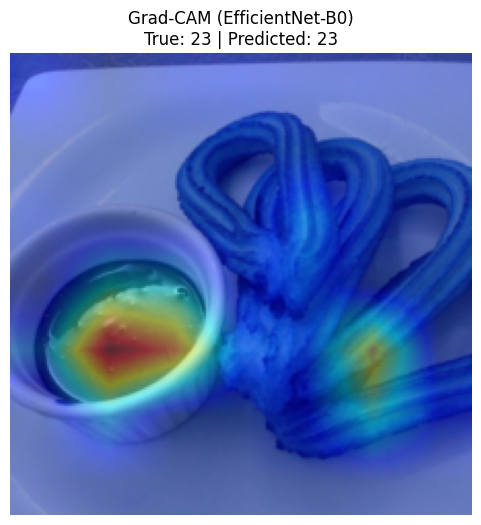

In [19]:
import random
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt

# -----------------------------
# 1️⃣ Pick random image from test loader
# -----------------------------
batch = random.choice(list(test_loader))
images, labels = batch

idx = random.randint(0, len(images)-1)
img_tensor = images[idx].unsqueeze(0).to(device)
img_tensor.requires_grad_()   # IMPORTANT

true_label = labels[idx].item()

# Unnormalize for visualization
img_np = images[idx].permute(1,2,0).numpy()
img_np = img_np * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
img_np = np.clip(img_np, 0, 1)

# -----------------------------
# 2️⃣ Hook for activations and gradients
# -----------------------------
gradients = None
activations = None

def save_gradient(module, grad_input, grad_output):
    global gradients
    gradients = grad_output[0]

def save_activation(module, input, output):
    global activations
    activations = output

# ---- Correct Layer for EfficientNet ----
target_layer = efficient_model.features[-2]   # FIXED

target_layer.register_forward_hook(save_activation)
target_layer.register_backward_hook(save_gradient)

# -----------------------------
# 3️⃣ Forward pass
# -----------------------------
efficient_model.eval()
output = efficient_model(img_tensor)
pred_class = output.argmax(1).item()

print(f"🎯 True Label: {true_label}  |  🤖 Predicted Label: {pred_class}")

# -----------------------------
# 4️⃣ Backward pass for Grad-CAM
# -----------------------------
efficient_model.zero_grad()
output[0, pred_class].backward(retain_graph=True)

if gradients is None:
    raise RuntimeError("❌ Gradients were not captured. Layer hook mismatch.")

# -----------------------------
# 5️⃣ Compute CAM
# -----------------------------
grad = gradients.detach().cpu().numpy()[0]  
act = activations.detach().cpu().numpy()[0] 

weights = np.mean(grad, axis=(1,2))
cam = np.zeros(act.shape[1:], dtype=np.float32)

for w, a in zip(weights, act):
    cam += w * a

cam = np.maximum(cam, 0)
cam = cv2.resize(cam, (224, 224))
cam = (cam - cam.min()) / (cam.max() - cam.min())

# -----------------------------
# 6️⃣ Heatmap Overlay
# -----------------------------
heatmap = cv2.applyColorMap(np.uint8(cam * 255), cv2.COLORMAP_JET)
overlay = (0.4 * heatmap + 0.6 * (img_np * 255)).astype(np.uint8)

plt.figure(figsize=(6,6))
plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
plt.title(f"Grad-CAM (EfficientNet-B0)\nTrue: {true_label} | Predicted: {pred_class}")
plt.axis("off")
plt.show()
